In [23]:
import pandas as pd
#data_folder = '/Users/alicia/Desktop/McGill MMA/2023 Summer/Deep learning/Project/data/'
data_folder = '/content/drive/MyDrive/McGill_MMA/DL/data/'
filename = 'train.csv'
data_path = data_folder + filename

df_train_raw = pd.read_csv(data_path)

df_train_raw

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [24]:
df_train_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [25]:
df_train_raw.shape

(1460, 81)

<Axes: xlabel='SalePrice', ylabel='Count'>

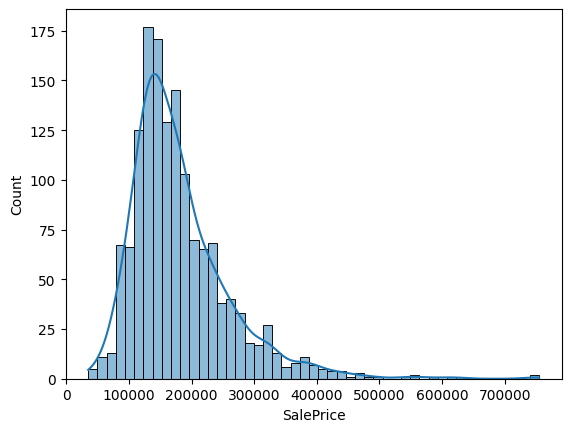

In [26]:
# Check the distribution of the regression target - SalePrice
import seaborn as sns
sns.histplot(df_train_raw['SalePrice'], kde=True)

# Sales price does not follow normal distribution, so it needs to be transformed for the regression task

<ipython-input-27-7a05f7d595c2>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_train_raw['SalePrice'], kde=False, fit=st.lognorm)


<Axes: xlabel='SalePrice'>

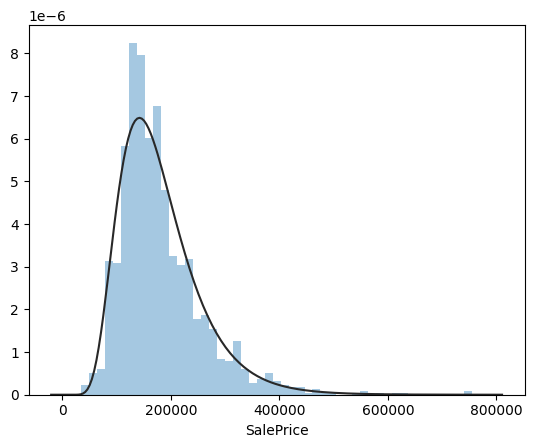

In [27]:
# Show the effect of log transformation

import scipy.stats as st
sns.distplot(df_train_raw['SalePrice'], kde=False, fit=st.lognorm)

In [28]:
# Define the columns based on value types
numerical_cols = [column for column in df_train_raw.columns if df_train_raw.dtypes[column] != 'object']
numerical_cols.remove('SalePrice')
numerical_cols.remove('Id')
categorical_cols = [column for column in df_train_raw.columns if df_train_raw.dtypes[column] == 'object']

<Axes: >

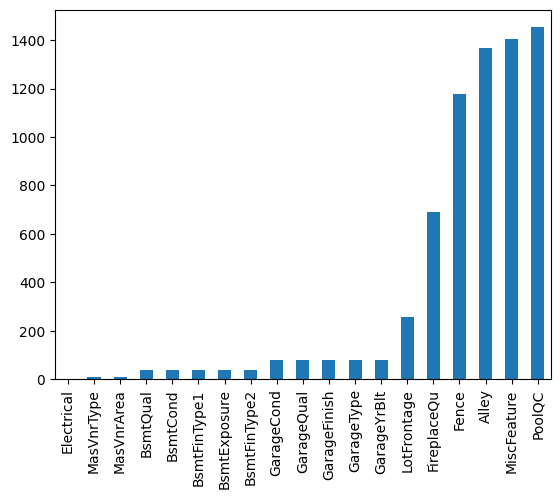

In [29]:
# Check the columns containing missing value

import matplotlib.pyplot as plt
missing = df_train_raw.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot.bar()

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packa

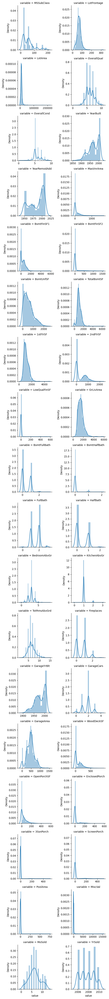

In [30]:
# Check the distribution of all the numerical attributes
f = pd.melt(df_train_raw, value_vars=numerical_cols)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False)
g = g.map(sns.distplot, "value")

# Few follows normal distribution, so those should be transformed as well.

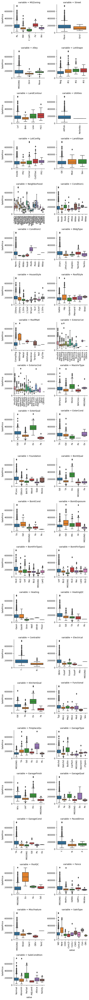

In [31]:
# Categorical variables with reepect to sales price
df_train_raw2 = df_train_raw.copy()
for c in categorical_cols:
    df_train_raw2[c] = df_train_raw2[c].astype('category')
    if df_train_raw2[c].isnull().any():
        df_train_raw2[c] = df_train_raw2[c].cat.add_categories(['MISSING'])
        df_train_raw2[c] = df_train_raw2[c].fillna('MISSING')

def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
f = pd.melt(df_train_raw2, id_vars=['SalePrice'], value_vars=categorical_cols)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False)
g = g.map(boxplot, "value", "SalePrice")

# Some categories have more diverse values according to SalesPrice. 
# For instance, having a pool to the property seems to improve price substantially



<Axes: >

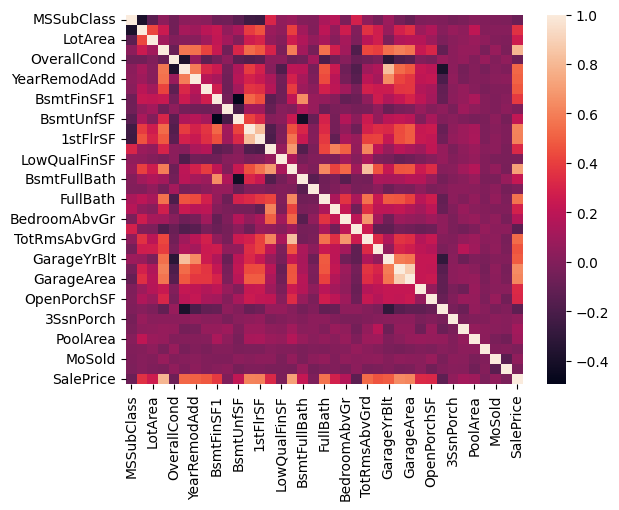

In [32]:
# Check for correlation
plt.figure(1)
corr = df_train_raw[numerical_cols+['SalePrice']].corr()
sns.heatmap(corr)

#### There seems to be a lot of strong correlations. For Salesprice, the overall condition (OverallCond), total rooms above grade (TotRmsAbvGrd), three season porch area in square feet (3SsnPorch) seem to have strong correlation with the price.

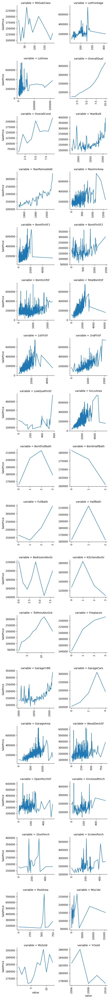

In [33]:
# Pair plot the numerical attributes with the sales price

def pairplot(x, y, **kwargs):
    ax = plt.gca()
    ts = pd.DataFrame({'time': x, 'val': y})
    ts = ts.groupby('time').mean()
    ts.plot(ax=ax)
    plt.xticks(rotation=90)
    
f = pd.melt(df_train_raw, id_vars=['SalePrice'], value_vars=numerical_cols)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False)
g = g.map(pairplot, "value", "SalePrice")

#### A lot of nonlinearities are identified for the numerical variables.

## Build new variable: House Category 

In [103]:
df_train_raw['HouseStyle'].value_counts()

1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64

In [35]:
df_train_raw['BldgType'].value_counts()

1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64

In [36]:
df_train_raw['YearBuilt'].value_counts()

2006    67
2005    64
2004    54
2007    49
2003    45
        ..
1875     1
1911     1
1917     1
1872     1
1905     1
Name: YearBuilt, Length: 112, dtype: int64

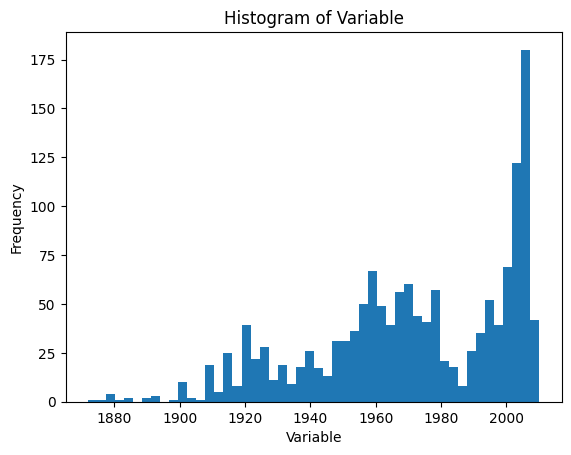

In [37]:
import matplotlib.pyplot as plt


# Plotting the histogram
plt.hist(df_train_raw['YearBuilt'], bins=50)  # Adjust the number of bins as needed
plt.xlabel('Variable')
plt.ylabel('Frequency')
plt.title('Histogram of Variable')
plt.show()

# After observation, I set the building year cutoff to be 1960

In [38]:
df_train_raw['YearRemodAdd'].value_counts()

1950    178
2006     97
2007     76
2005     73
2004     62
       ... 
2010      6
1986      5
1952      5
1983      5
1951      4
Name: YearRemodAdd, Length: 61, dtype: int64

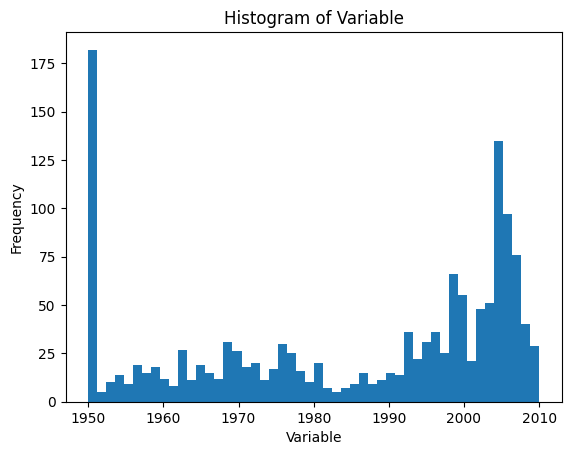

In [39]:
import matplotlib.pyplot as plt


# Plotting the histogram
plt.hist(df_train_raw['YearRemodAdd'], bins=50)  # Adjust the number of bins as needed
plt.xlabel('Variable')
plt.ylabel('Frequency')
plt.title('Histogram of Variable')
plt.show()

# After observation, I set the renovation year cutoff to be 1990

In [40]:

df_train_raw['YearBuilt2'] = df_train_raw['YearBuilt'].apply(lambda x: 'built<1960' if x < 1960 else 'built>=1960')
df_train_raw.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,YearBuilt2
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,built>=1960
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,built>=1960
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,built>=1960
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,built<1960
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,built>=1960


In [41]:

df_train_raw['YearRemodAdd2'] = df_train_raw['YearRemodAdd'].apply(lambda x: 'remodAdd<1990' if x < 1990 else 'remodAdd>=1990')
df_train_raw.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,YearBuilt2,YearRemodAdd2
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,2,2008,WD,Normal,208500,built>=1960,remodAdd>=1990
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,5,2007,WD,Normal,181500,built>=1960,remodAdd<1990
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,9,2008,WD,Normal,223500,built>=1960,remodAdd>=1990
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,2,2006,WD,Abnorml,140000,built<1960,remodAdd<1990
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,12,2008,WD,Normal,250000,built>=1960,remodAdd>=1990


In [42]:
import pandas as pd

# Assuming 'df' is your DataFrame containing the data
df_train_raw['HouseCategory'] = df_train_raw['HouseStyle'].str.cat([df_train_raw['BldgType'], df_train_raw['YearBuilt2'].astype(str), df_train_raw['YearRemodAdd2'].astype(str)], sep='_')
df_train_raw.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,YearBuilt2,YearRemodAdd2,HouseCategory
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,NaN,0,2,2008,WD,Normal,208500,built>=1960,remodAdd>=1990,2Story_1Fam_built>=1960_remodAdd>=1990
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,NaN,0,5,2007,WD,Normal,181500,built>=1960,remodAdd<1990,1Story_1Fam_built>=1960_remodAdd<1990
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,NaN,0,9,2008,WD,Normal,223500,built>=1960,remodAdd>=1990,2Story_1Fam_built>=1960_remodAdd>=1990
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,NaN,0,2,2006,WD,Abnorml,140000,built<1960,remodAdd<1990,2Story_1Fam_built<1960_remodAdd<1990
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,NaN,0,12,2008,WD,Normal,250000,built>=1960,remodAdd>=1990,2Story_1Fam_built>=1960_remodAdd>=1990


In [43]:
len(df_train_raw['HouseCategory'].value_counts()) 

59

## Data Preprocessing

In [44]:

# Preprocessing function
from sklearn.preprocessing import StandardScaler

def preprocess(df):
    df = df.copy() # Make copy so we don't ruin the original dataframe
    df = df.drop(columns=["Id"], errors='ignore') # Drop Id column
    
    numeric_cols = df.select_dtypes(np.number).columns # Numerical column name
    numeric_cols = numeric_cols.drop("SalePrice", errors='ignore') # Drop label
    numeric_cols = numeric_cols.drop("HouseCategory", errors='ignore') # Drop classification 'HouseCategory'
    categorical_cols =  df.select_dtypes(include=['object']).columns # Categorical column name
    
    df_categorical = pd.get_dummies(df[categorical_cols], dummy_na=True) # OneHotEncoding, dummy_na indicates if the cell contain NA
    
    df_numerical = df[numeric_cols].apply(lambda x: (x - x.mean()) / (x.std())) # Normalize every numerical column
    df_numerical = df_numerical.fillna(0) # Fill in missing value with mean 0
    
    df = pd.concat([df_numerical, df_categorical], axis=1) # Bind numerical column and categorical column
    
    return df

In [45]:
import numpy as np
# Get inputs and target from train data
df_train_y_regression = df_train_raw["SalePrice"].copy() # Copy the target
df_train_y_classification = df_train_raw["HouseCategory"].copy() # Copy the target
df_train_y_regression = np.log(df_train_y_regression, where=df_train_y_regression != 0) # Scale the target
df_train_X = preprocess(df_train_raw) # Preprocess the inputs




from sklearn.model_selection import train_test_split

# Split the data for regression task
df_train_X_regression, df_val_X_regression, df_train_y_regression, df_val_y_regression = train_test_split(
    df_train_X, df_train_y_regression, train_size=0.8, random_state=42
)

# Split the data for classification task
df_train_X_classification, df_val_X_classification, df_train_y_classification, df_val_y_classification = train_test_split(
    df_train_X, df_train_y_classification, train_size=0.8, random_state=42
)

In [46]:
df_train_X = df_train_X_regression

In [47]:
df_val_X = df_val_X_regression

In [48]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_train_y_classification = label_encoder.fit_transform(df_train_y_classification).astype('uint8')

df_train_y_classification

array([12, 34, 12, ..., 13,  1, 22], dtype=uint8)

In [49]:


from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_val_y_classification = label_encoder.fit_transform(df_val_y_classification).astype('uint8')

df_val_y_classification

array([ 9, 20,  6,  0,  9, 30,  1, 25, 32,  0,  0,  8,  6,  9, 20,  7, 20,
        9,  6,  9,  7, 20, 20,  7,  9, 14,  9,  6, 20, 14,  1, 20,  1,  6,
        9,  8,  0, 20, 20,  6,  0, 20,  8,  9,  8, 17,  8,  8, 20,  0,  6,
        8, 23,  8, 14,  9, 20,  8, 34,  7,  6,  7, 20,  9,  9,  7,  0, 20,
        9, 24, 12,  8,  6, 11,  9,  9, 20, 20,  6,  8, 26,  6,  6,  7, 19,
        1, 20,  8, 14, 20,  6, 19,  8, 19, 12,  9,  1, 24,  9, 19,  8, 20,
        8,  5, 34,  6,  9,  8,  9, 19,  6,  8,  9, 18, 20,  7,  7,  8,  3,
        9, 31, 14, 20,  1,  8,  8, 20,  6,  9, 19, 20,  9, 20, 16,  6,  9,
       14,  8,  9, 20, 20,  7, 19,  0, 10, 27,  0,  9, 28,  6,  6, 19,  6,
       22,  6, 22, 29,  6,  7,  8,  9, 29,  9,  7,  0, 12, 20, 20, 20, 17,
        9,  4,  0, 25,  2,  0,  0,  2,  1, 26, 35,  6, 34, 18, 20, 17,  9,
       14, 14, 25, 23,  6,  0, 34, 15, 18, 14, 17, 26,  0,  8, 20, 18, 20,
        9, 34, 20,  8,  1,  8, 20,  8,  6, 24,  7,  9, 14, 33, 33,  3,  8,
       14,  8,  0,  9,  7

In [50]:
df_val_y_classification.dtype

dtype('uint8')

In [51]:
print(df_val_X.isnull().sum())

MSSubClass                                              0
LotFrontage                                             0
LotArea                                                 0
OverallQual                                             0
OverallCond                                             0
                                                       ..
HouseCategory_SLvl_2fmCon_built<1960_remodAdd<1990      0
HouseCategory_SLvl_Duplex_built>=1960_remodAdd<1990     0
HouseCategory_SLvl_TwnhsE_built>=1960_remodAdd>=1990    0
HouseCategory_SLvl_Twnhs_built>=1960_remodAdd<1990      0
HouseCategory_nan                                       0
Length: 397, dtype: int64


In [52]:
df_train_X.isnull().sum()

MSSubClass                                              0
LotFrontage                                             0
LotArea                                                 0
OverallQual                                             0
OverallCond                                             0
                                                       ..
HouseCategory_SLvl_2fmCon_built<1960_remodAdd<1990      0
HouseCategory_SLvl_Duplex_built>=1960_remodAdd<1990     0
HouseCategory_SLvl_TwnhsE_built>=1960_remodAdd>=1990    0
HouseCategory_SLvl_Twnhs_built>=1960_remodAdd<1990      0
HouseCategory_nan                                       0
Length: 397, dtype: int64

In [53]:
df_train_y_regression.isnull().sum()

0

In [54]:
df_train_y_regression.dtype

dtype('float64')

In [56]:
pip install pytorch-lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 720.6/720.6 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 42.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 12.5 MB/s eta 0:00:00


In [104]:
from sklearn.utils.extmath import softmax
# MultiTaskModel v2

import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset
import pytorch_lightning as pl
import pandas as pd

# Import necessary libraries
from sklearn.metrics import mean_squared_error, accuracy_score
import numpy as np

# Evaluation function for regression task
def evaluate_regression(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    return mse, rmse

# Evaluation function for classification task
def evaluate_classification(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    return accuracy

class MultiTaskModel(pl.LightningModule):
    def __init__(self, num_hidden_layers = 2, activation_function = 'relu', optimizer='SGD'):
        super(MultiTaskModel, self).__init__()
        self.num_hidden_layers = num_hidden_layers
        self.activation_function = activation_function
        self.optimizer = optimizer

        self.shared_layers = nn.Sequential(
            # Shared layers of your model
            nn.Linear(397, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
        )

        self.hidden_layers = nn.ModuleList()
        for _ in range(self.num_hidden_layers):
            self.hidden_layers.append(nn.Linear(32, 32)) #(32, 16)

        self.regression_layers = nn.Sequential(
            # Regression-specific layers
            nn.ReLU(),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 1), # 1 for the regression of prices
        )
        self.classification_layers = nn.Sequential(
            # Classification-specific layers
            nn.ReLU(),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 59), # 59 classes for the building types
            nn.Sigmoid(),
        )

        self.regression_criterion = nn.MSELoss()
        self.classification_criterion = nn.CrossEntropyLoss()

    def forward(self, x):
        shared_output = self.shared_layers(x)

        for i in range(self.num_hidden_layers):
            shared_output = self.hidden_layers[i](shared_output)
            shared_output = self.get_activation_function()(shared_output)

        regression_output = self.regression_layers(shared_output)
        classification_output = self.classification_layers(shared_output)
        return regression_output, classification_output

    def get_activation_function(self):
        if self.activation_function == 'relu':
            return nn.ReLU()
        elif self.activation_function == 'sigmoid':
            return nn.Sigmoid()
        elif self.activation_function == 'softmax':
            return nn.Softmax()
        else:
            raise ValueError(f"Invalid activation function: {self.activation_function}. Supported options are 'relu', 'sigmoid', 'softmax'.")
    
    def configure_optimizers(self):
        if self.optimizer == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=0.002, momentum=0.9, weight_decay=0.001)
        elif self.optimizer == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=0.002, weight_decay=0.001)
        else:
            raise ValueError(f"Invalid optimizer: {self.optimizer}. Supported options are 'SGD' and 'Adam'.")
        return optimizer

    def training_step(self, batch, batch_idx):
        x, y_regression, y_classification = batch
        regression_output, classification_output = self.forward(x)
        regression_loss = self.regression_criterion(regression_output, y_regression)
        classification_loss = self.classification_criterion(classification_output, y_classification)
        loss = regression_loss + classification_loss
        self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y_regression, y_classification = batch
        regression_output, classification_output = self.forward(x)
        regression_loss = self.regression_criterion(regression_output, y_regression)
        classification_loss = self.classification_criterion(classification_output, y_classification)
        loss = regression_loss + classification_loss
        self.log('val_loss', loss)


        # Convert tensors to numpy arrays
        y_regression = y_regression.cpu().numpy()
        y_classification = y_classification.cpu().numpy()
        regression_output = regression_output.cpu().detach().numpy()
        classification_output = classification_output.cpu().detach().numpy()
        
        # Evaluate regression task
        regression_mse, regression_rmse = evaluate_regression(y_regression, regression_output)
        
        # Evaluate classification task
        classification_accuracy = evaluate_classification(y_classification, np.argmax(classification_output, axis=1))
        
        # Log the evaluation metrics
        self.log('val_loss', loss)
        self.log('regression_mse', regression_mse)
        self.log('regression_rmse', regression_rmse)
        self.log('classification_accuracy', classification_accuracy)
        
        return loss



In [58]:
batch_size = 16

class MultiTaskDataModule(pl.LightningDataModule):
    def __init__(self, df_train_X, df_train_y_regression, df_train_y_classification, df_val_X, df_val_y_regression, df_val_y_classification, batch_size=batch_size):
        super(MultiTaskDataModule, self).__init__()
        self.df_train_X = df_train_X
        self.df_train_y_regression = df_train_y_regression
        self.df_train_y_classification = df_train_y_classification
        self.df_val_X = df_val_X
        self.df_val_y_regression = df_val_y_regression
        self.df_val_y_classification = df_val_y_classification
        self.batch_size = batch_size

    def setup(self, stage=None):
        train_X = torch.tensor(self.df_train_X.values).float()
        train_y_regression = torch.tensor(self.df_train_y_regression.values).float().unsqueeze(1)
        train_y_classification = torch.tensor(self.df_train_y_classification.astype(np.uint8)).long()
        self.train_dataset = TensorDataset(train_X, train_y_regression, train_y_classification)

        val_X = torch.tensor(self.df_val_X.values).float()
        val_y_regression = torch.tensor(self.df_val_y_regression.values).float().unsqueeze(1)
        val_y_classification = torch.tensor(self.df_val_y_classification.astype(np.uint8)).long()
        self.val_dataset = TensorDataset(val_X, val_y_regression, val_y_classification)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size)




In [ ]:
import torch 
from torch import nn

device = torch.device('cpu')  # Use the CPU for computations

# Initialize data module
data_module = MultiTaskDataModule(df_train_X, df_train_y_regression, df_train_y_classification, df_val_X, df_val_y_regression, df_val_y_classification)

# Initialize model
model = MultiTaskModel().to(device)

# Specify the logger folder path
from pytorch_lightning.loggers import TensorBoardLogger
logger = TensorBoardLogger(save_dir='logs/', name='my_experiment')

# Initialize trainer
trainer = pl.Trainer(max_epochs=30, accelerator = 'auto', logger = logger)

# Train the model
trainer.fit(model, data_module)




INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                     | Type             | Params
--------------------------------------------------------------
0 | shared_layers            | Sequential       | 27.6 K
1 | regression_layers        | Sequential       | 545   
2 | classification_layers    | Sequential       | 1.5 K 
3 | regression_criterion     | MSELoss          | 0     
4 | classification_criterion | CrossEntropyLoss | 0     
--------------------------------------------------------------
29.6 K    Trainable params
0         Non-trainable params
29.6 K    Total params
0.119     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [63]:
# After training, you can access the logged metrics from the logger
logger = trainer.logger

train_loss_value = trainer.logged_metrics['train_loss']

val_loss = trainer.logged_metrics['val_loss']
regression_mse = trainer.logged_metrics['regression_mse']
regression_rmse = trainer.logged_metrics['regression_rmse']
classification_accuracy = trainer.logged_metrics['classification_accuracy']

print('Validation Loss:', train_loss_value) #val_loss
print('Regression MSE:', regression_mse)
print('Regression RMSE:', regression_rmse)
print('Classification Accuracy:', classification_accuracy)

Validation Loss: tensor(3.6018)
Regression MSE: tensor(0.0206)
Regression RMSE: tensor(0.1409)
Classification Accuracy: tensor(0.0034, dtype=torch.float64)


## Hyperparameter Tuning with Optuna

In [64]:
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 27.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 10.3 MB/s eta 0:00:00


In [65]:
pip install --upgrade pytorch-lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [66]:
import optuna
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger


In [67]:
# Original hyperparameter tuning

def objective(trial):
    # Define the hyperparameters to optimize
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
    batch_size = trial.suggest_categorical("batch_size", [8, 16, 32, 64, 128])

    # Initialize data module with the updated batch_size
    data_module = MultiTaskDataModule(df_train_X, df_train_y_regression, df_train_y_classification, df_val_X, df_val_y_regression, df_val_y_classification, batch_size=batch_size)

    # Initialize the model
    model = MultiTaskModel()

    # Define the optimizer with the suggested learning rate
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

    # Initialize the trainer
    trainer = Trainer(
        logger=logger,
        callbacks=[EarlyStopping(monitor='val_loss')],
        max_epochs=30,
        #gpus=1,  # Set the number of GPUs to use (change it according to your setup)
        #progress_bar_refresh_rate=0,  # Disable the progress bar
        #checkpoint_callback=False,  # Disable checkpoint saving
    )

    # Train the model
    trainer.fit(model, data_module)

    # Get the validation loss to minimize
    val_loss = trainer.logged_metrics['val_loss']
    return val_loss


In [ ]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=10)  # Run 10 trials for demonstration purposes


[I 2023-06-11 19:50:31,913] A new study created in memory with name: no-name-0a309328-6d1f-43d1-99a1-afd4ca890961
<ipython-input-67-ec764dc4632f>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:615: UserWarning: Checkpoint directory logs/my_experiment/version_1/checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and i

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[I 2023-06-11 19:51:19,054] Trial 0 finished with value: 4.065298080444336 and parameters: {'learning_rate': 3.9105711187032136e-05, 'batch_size': 16}. Best is trial 0 with value: 4.065298080444336.
<ipython-input-67-ec764dc4632f>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:615: UserWarning: Checkpoint directory logs/my_experiment/version_1/checkpoints ex

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (10) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2023-06-11 19:51:25,102] Trial 1 finished with value: 4.10245418548584 and parameters: {'learning_rate': 0.0028581635640051568, 'batch_size': 128}. Best is trial 0 with value: 4.065298080444336.
<ipython-input-67-ec764dc4632f>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkp

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (19) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2023-06-11 19:51:33,710] Trial 2 finished with value: 4.097982406616211 and parameters: {'learning_rate': 1.5831534379805764e-05, 'batch_size': 64}. Best is trial 0 with value: 4.065298080444336.
<ipython-input-67-ec764dc4632f>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_check

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (19) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2023-06-11 19:51:42,903] Trial 3 finished with value: 4.098837375640869 and parameters: {'learning_rate': 3.161013493625693e-05, 'batch_size': 64}. Best is trial 0 with value: 4.065298080444336.
<ipython-input-67-ec764dc4632f>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkp

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[I 2023-06-11 19:52:04,860] Trial 4 finished with value: 4.025376796722412 and parameters: {'learning_rate': 2.893359591425693e-05, 'batch_size': 16}. Best is trial 4 with value: 4.025376796722412.
<ipython-input-67-ec764dc4632f>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:615: UserWarning: Checkpoint directory logs/my_experiment/version_1/checkpoints exi

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (19) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.
[I 2023-06-11 19:52:13,476] Trial 5 finished with value: 4.1117658615112305 and parameters: {'learning_rate': 0.0015823303589403504, 'batch_size': 64}. Best is trial 4 with value: 4.025376796722412.
<ipython-input-67-ec764dc4632f>:3: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_check

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:280: PossibleUserWarning: The number of training batches (37) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [107]:
print("Best hyperparameters: ", study.best_params)
print("Best validation loss: ", study.best_value)


Best hyperparameters:  {'learning_rate': 2.2230285823527568e-05, 'num_hidden_layers': 8, 'activation_function': 'relu', 'optimizer': 'Adam'}
Best validation loss:  4.132654190063477


In [108]:


# Updated Hyperparameter tuning with Pl lightning integration with Optuna

import optuna
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger

def objective(trial):
    # Define the hyperparameters to optimize
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
    #batch_size = trial.suggest_categorical("batch_size", [8, 16, 32, 64, 128])
    num_hidden_layers = trial.suggest_int("num_hidden_layers", 8, 64, 128)
    #num_hidden_layers = trial.suggest_int("num_hidden_layers", 1, 3)
    activation_function = trial.suggest_categorical("activation_function", ["relu", "sigmoid","softmax"])
    optimizer = trial.suggest_categorical("optimizer", ["SGD", "Adam"])

    # Initialize data module with the updated batch_size
    data_module = MultiTaskDataModule(df_train_X, df_train_y_regression, df_train_y_classification, df_val_X, df_val_y_regression, df_val_y_classification)

    # Initialize the model
    model = MultiTaskModel(num_hidden_layers = num_hidden_layers)

    # Define the optimizer with the suggested hyperparameters
    model = MultiTaskModel(num_hidden_layers=num_hidden_layers, activation_function=activation_function, optimizer=optimizer)

    # Define the optimizer with the suggested learning rate
    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
    
    # Initialize the trainer
    trainer = Trainer(
        logger=logger,
        callbacks=[EarlyStopping(monitor='val_loss')],
        max_epochs=30,
    )
    
    # Train the model
    trainer.fit(model, data_module)

    # Get the validation loss to minimize
    val_loss = trainer.logged_metrics['val_loss']
    return val_loss





In [106]:
# TBC: Identify the best parameters, print the performance, and get the trained best model
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=10)  # Run 10 trials for demonstration purposes



[I 2023-06-11 23:16:08,561] A new study created in memory with name: no-name-9f556e7c-7f31-4605-827c-a585c22d6297
<ipython-input-105-2a49da0a9a34>:10: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [8, 64] and step=128, but the range is not divisible by `step`. It will be replaced by [8, 8].
  warnings.warn(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[I 2023-06-11 23:16:23,896] Trial 0 finished with value: 4.132654190063477 and parameters: {'learning_rate': 2.2230285823527568e-05, 'num_hidden_layers': 8, 'activation_function': 'relu', 'optimizer': 'Adam'}. Best is trial 0 with value: 4.132654190063477.
<ipython-input-105-2a49da0a9a34>:10: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [8, 64] and step=128, but the range is not divisible by `step`. It will be replaced by [8, 8].
  warnings.warn(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zer

Sanity Checking: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)


Training: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)


Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Sanity Checking: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)


Training: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)


Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[I 2023-06-11 23:17:07,907] Trial 4 finished with value: 4.292891502380371 and parameters: {'learning_rate': 4.736927065799217e-05, 'num_hidden_layers': 8, 'activation_function': 'sigmoid', 'optimizer': 'Adam'}. Best is trial 0 with value: 4.132654190063477.
<ipython-input-105-2a49da0a9a34>:10: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [8, 64] and step=128, but the range is not divisible by `step`. It will be replaced by [8, 8].
  warnings.warn(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_z

Sanity Checking: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)


Training: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[I 2023-06-11 23:17:26,030] Trial 6 finished with value: 4.303308010101318 and parameters: {'learning_rate': 0.0002639742894374641, 'num_hidden_layers': 8, 'activation_function': 'sigmoid', 'optimizer': 'Adam'}. Best is trial 0 with value: 4.132654190063477.
<ipython-input-105-2a49da0a9a34>:10: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [8, 64] and step=128, but the range is not divisible by `step`. It will be replaced by [8, 8].
  warnings.warn(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_z

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

[I 2023-06-11 23:17:32,157] Trial 7 finished with value: 4.29569673538208 and parameters: {'learning_rate': 1.7451778933256562e-05, 'num_hidden_layers': 8, 'activation_function': 'sigmoid', 'optimizer': 'Adam'}. Best is trial 0 with value: 4.132654190063477.
<ipython-input-105-2a49da0a9a34>:10: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-1)
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [8, 64] and step=128, but the range is not divisible by `step`. It will be replaced by [8, 8].
  warnings.warn(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_z

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

Validation: 0it [00:00, ?it/s]

<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  shared_output = self.get_activation_function()(shared_output)
<ipython-input-104-2846487e31da>:68: UserWarning: Implicit dimension choice for softmax has been deprecated. Cha

In [109]:
# Fetch the best trial
best_trial = study.best_trial

# Get the best hyperparameters
best_params = best_trial.params

# Retrieve the best hyperparameters
best_learning_rate = best_params["learning_rate"]
best_num_hidden_layers = best_params["num_hidden_layers"]
best_activation_function = best_params["activation_function"]
best_optimizer = best_params["optimizer"]

# Initialize data module with the best hyperparameters
data_module = MultiTaskDataModule(df_train_X, df_train_y_regression, df_train_y_classification, df_val_X, df_val_y_regression, df_val_y_classification)

# Initialize the model with the best hyperparameters
model = MultiTaskModel(num_hidden_layers=best_num_hidden_layers, activation_function=best_activation_function, optimizer=best_optimizer)

# Define the optimizer with the best learning rate
optimizer = torch.optim.SGD(model.parameters(), lr=best_learning_rate)

# Initialize the trainer
trainer = Trainer(logger=logger)

# Train the model with the best hyperparameters
trainer.fit(model, data_module)



INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/utilities.py:70: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
  rank_zero_warn(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:615: UserWarning: Checkpoint directory logs/my_experiment/version_1/checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.callbacks.model_summary:
  | Name                     | Type             | Params
--------------------------------------------------------------
0 | shared_layer

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1000` reached.


In [110]:
# After training, you can access the logged metrics from the logger
train_loss_value = trainer.logged_metrics['train_loss']
val_loss = trainer.logged_metrics['val_loss']
regression_mse = trainer.logged_metrics['regression_mse']
regression_rmse = trainer.logged_metrics['regression_rmse']
classification_accuracy = trainer.logged_metrics['classification_accuracy']

print('Best Model Performance:')
print('Validation Loss:', val_loss)
print('Regression MSE:', regression_mse)
print('Regression RMSE:', regression_rmse)
print('Classification Accuracy:', classification_accuracy)

Best Model Performance:
Validation Loss: tensor(4.1273)
Regression MSE: tensor(0.0214)
Regression RMSE: tensor(0.1399)
Classification Accuracy: tensor(0.0034, dtype=torch.float64)


In [96]:
# Save the model checkpoints
model_path = "best_model.pt"
torch.save(model.state_dict(), model_path)

# Print the path to the saved model
print("Best model saved at:", model_path)

Best model saved at: best_model.pt


In [111]:
print("Best hyperparameters: ", study.best_params)
print("Best validation loss: ", study.best_value)

Best hyperparameters:  {'learning_rate': 2.2230285823527568e-05, 'num_hidden_layers': 8, 'activation_function': 'relu', 'optimizer': 'Adam'}
Best validation loss:  4.132654190063477
